In [1]:
import pathlib
import os
from glob import glob

import h5py
import pandas as pd
import json
import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
import dask.array as da
import dask.dataframe as dd
import skimage 
import cloudpickle

import SessionTools.two_photon as st2p
# from SessionTools.two_photon import utilities
from SessionTools.utilities import *


import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['font.size'] = 18
matplotlib.rcParams['pdf.use14corefonts']=True
# matplotlib.rc('font', family='arial')



%load_ext autoreload
%autoreload 2 

%matplotlib inline

In [2]:

dates = ['14_02_2023',
         '23_02_2023',
         '07_03_2023',
         '08_03_2023',
         '15_03_2023',
         ] 
names = ['EPG_GCaMP7f_EL_CsChrimsontdT_fly2',
         'EPG_GCaMP7f_EL_CsChrimsontdT_fly3',
         'EPG_GCaMP7f_EL_CsChrimsontdT_fly2',
         'EPG_GCaMP7f_EL_CsChrimsontdT_fly2',
         'EPG_GCaMP_EL_CsChrimsontdT_fly2'
         ]

data_dicts = []


In [18]:
class Session:
    
    def __init__(self,date, name, fname, basedir = "/media/mplitt/SSD_storage/2P_scratch/"):
        self.name = name
        self.date = date
        with open(fname, 'rb') as file:
            self.data_dict = cloudpickle.load(file)
            
        self.basedir = pathlib.PurePath(f"{basedir}/{self.date}/{self.name}/figs")
        os.makedirs(self.basedir, exist_ok=True)
            
        self.get_starts_stops()
        self.concat_timeseries()
        # return self
        
    
    def get_starts_stops(self):
        opto_trig = np.concatenate([res['voltage_recording'][' Opto Trigger'] for res in self.data_dict['res']], axis=0)
        
        opto_trig_filled = 1.*opto_trig
        opto_inds = np.argwhere(opto_trig==1).ravel()
        for ind in opto_inds.tolist():
            # find times within 5 seconds of opto trigger
            # make those values also 1
            opto_trig_filled[ind-50:ind+50]=1
            
            
        starts = np.argwhere(st2p.preprocessing.signals.falling_edges(opto_trig_filled) > 0).ravel().tolist()
        starts = (0, *starts)

        stops = np.argwhere(st2p.preprocessing.signals.rising_edges(opto_trig_filled) > 0).ravel().tolist()
        stops = (*stops, opto_trig_filled.shape[0])
        self.starts = starts
        self.stops = stops
        # return self
        


    def concat_timeseries(self):
        self.dff = np.concatenate([res['dff'] for res in self.data_dict['res']], axis=1)
        self.pva_angle = np.concatenate([res['pva']['angle'] for res in self.data_dict['res']], axis=0)
        self.heading = np.concatenate([res['heading'] for res in self.data_dict['res']], axis=0)

        self.offset = np.concatenate([res['bump_offset'] for res in self.data_dict['res']], axis=0)
        # return self

    def offset_plot(self, save=True):
        
        
        fig,ax = plt.subplots()
        cmap = plt.cm.get_cmap('jet')
        bin_edges = np.linspace(-np.pi, np.pi, num=25)
        bin_centers = (bin_edges[:-1]+bin_edges[1:])/2.
        labels = ('baseline', '0 opto offset', '180 opto offset')
        for i, (start, stop) in enumerate(zip(self.starts,self.stops)):
            
            counts, _ = np.histogram(self.offset[start:stop],bins = bin_edges)
            ax.fill_between(bin_centers, counts/counts.sum(), alpha=.3, color=cmap(float(i+.1)/len(self.starts)), label=labels[i])
            
        ax.legend(loc='upper left')
        ax.plot([0,0],[0,.1], color = cmap(.333))
        ax.plot([bin_centers[-1],bin_centers[-1]],[0,.1], color= cmap(.666))

        ax.set_yticks([])
        for s in ('top', 'left', 'right'):
            ax.spines[s].set_visible(False)
            
        ax.set_xlabel('offset (radians)')
        
        ax.set_xticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi], labels = [r'$-\pi$', r'$-\pi/2$', r'$0$', r'$\pi/2$', r'$\pi$'])

        if save:
            
            fig_name = pathlib.Path(self.basedir.joinpath('offsets.pdf'))
            fig.savefig(fig_name,format='pdf')
            
    def single_session_plots(self, trim=0, cmap='Purples', vmin=0, vmax=3):
    
        for i, (start, stop) in enumerate(zip(self.starts,self.stops)):
            window = slice(start+trim,stop)
            fig, ax = plt.subplots(2,1,figsize=[20,6], sharex=True)
            dff_window = self.dff[:,window]
            ax[0].imshow(dff_window,aspect='auto',cmap=cmap,vmin=vmin,vmax=vmax)
            
            x = np.arange(stop-start-trim)
            print(start+1000,stop,self.heading.shape)
            ax[0].scatter(x,15*(self.heading[window]+np.pi)/2/np.pi,color='red',marker='_', s=1)
            
            
            ax[0].scatter(x,15*(self.pva_angle[window]+np.pi)/2/np.pi,color='black', s=.5)
            ax[0].set_yticks([-.5, 7, 15.5])
            ax[0].set_yticklabels([-3.14, 0, 3.14])
            ax[0].set_ylabel('EPG Wedge')
            
            
            offset_cmap = plt.cm.get_cmap('jet')
            ax[1].scatter(x,self.offset[window],s=2, color=offset_cmap(float(i+.1)/len(self.starts)))
            ax[1].set_ylim([-3.14,3.14])
            ax[1].set_yticks([-3.14,0,3.14])
            ax[1].set_yticklabels([-3.14, 0, 3.14])
            ax[1].set_ylabel('Offset')
            ax[1].set_xlabel('Time (s)')
            
            ax[1].set_xticks(x[0::500], labels=[str(int(i/10)) for i in range(0,x[-1]+1,500)])
            
            fig.savefig(self.basedir.joinpath(f'dff_{i}.pdf'),format='pdf')




In [19]:
sessions = []
for fly,date in zip (names,dates):
    fname = f"/media/mplitt/SSD_storage/2P_scratch/{date}/{fly}/combined_results.pkl"
    sessions.append(Session(date, fly, fname))

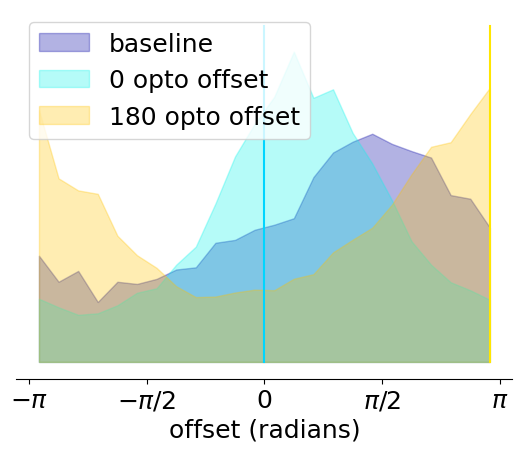

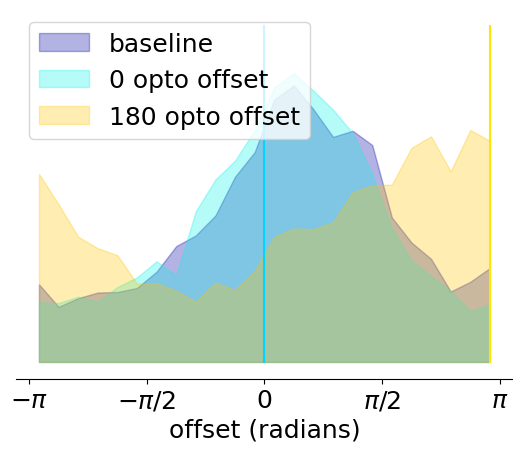

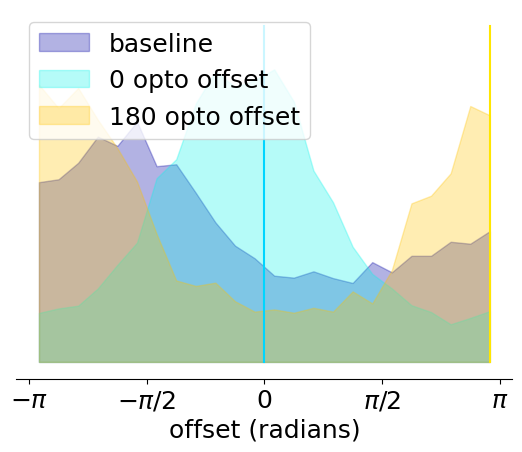

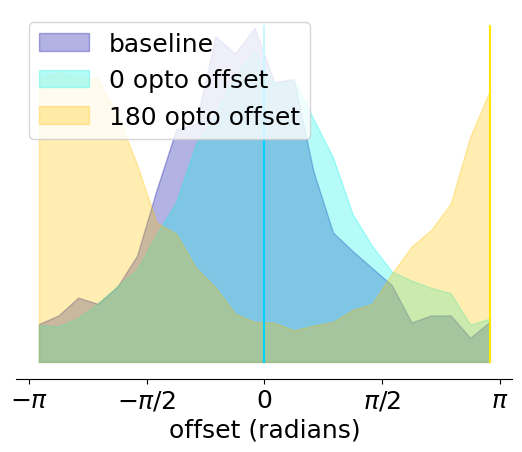

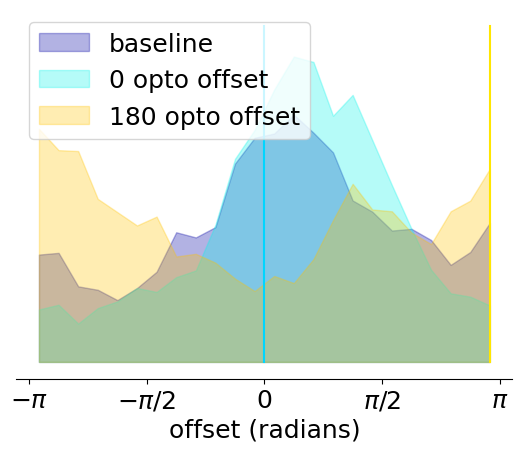

In [20]:
for session in sessions:
    session.offset_plot()

1000 4653 (17675,)
5883 11588 (17675,)
12818 17675 (17675,)
1000 6584 (19615,)
7800 14110 (19615,)
15327 19615 (19615,)
1000 6935 (20912,)
8147 14556 (20912,)
15767 20912 (20912,)
1000 4335 (14792,)
5548 10121 (14792,)
11334 14792 (14792,)
1000 3913 (13105,)
5115 9111 (13105,)
10313 13105 (13105,)


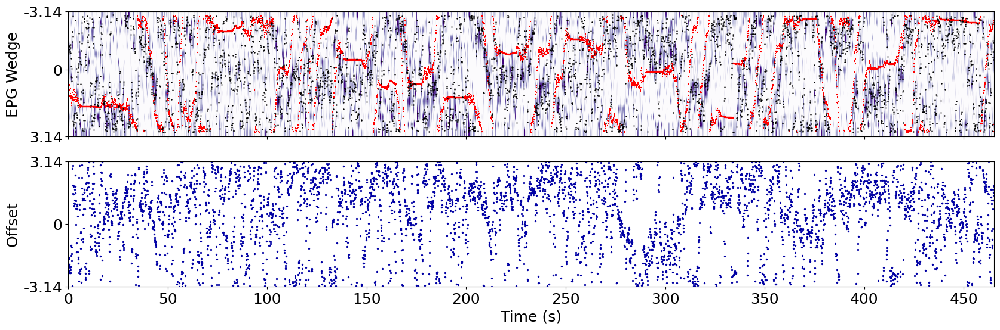

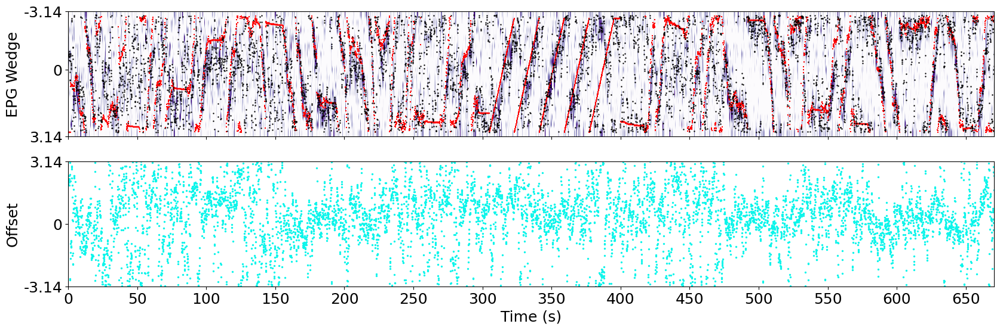

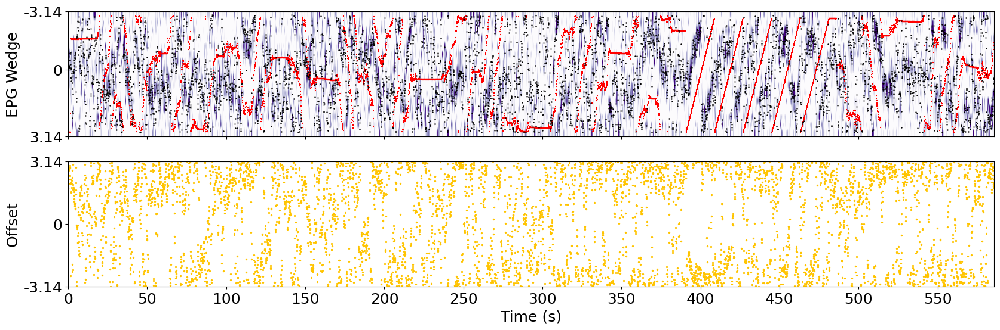

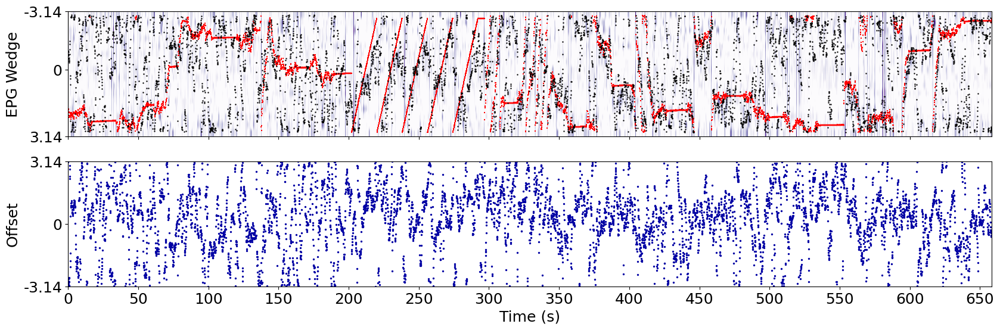

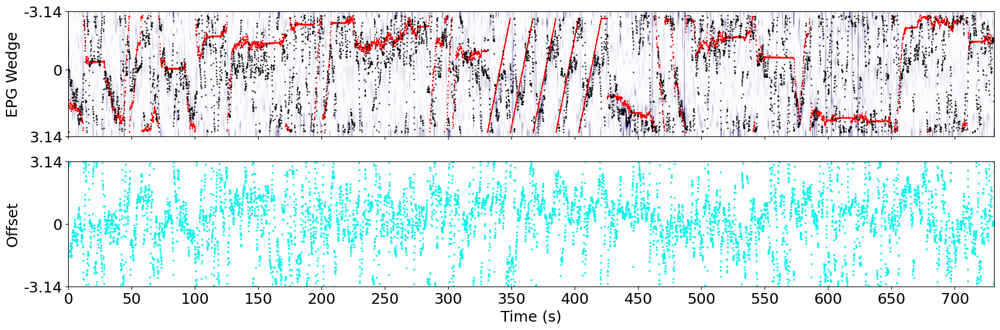

...

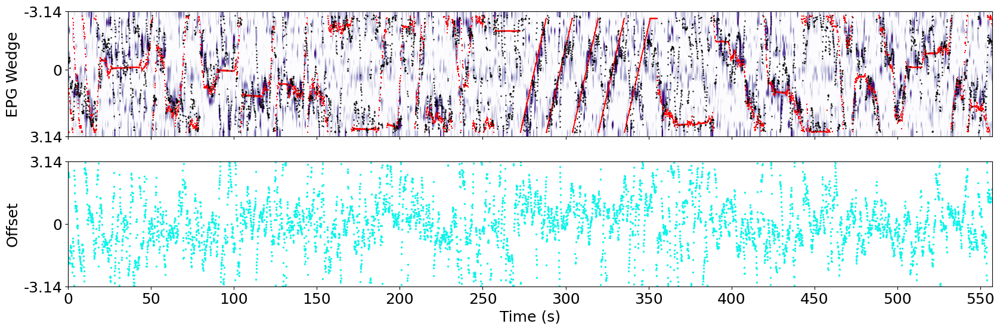

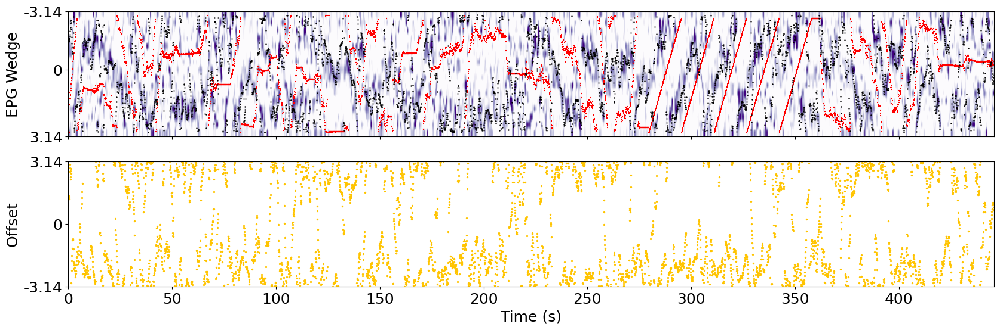

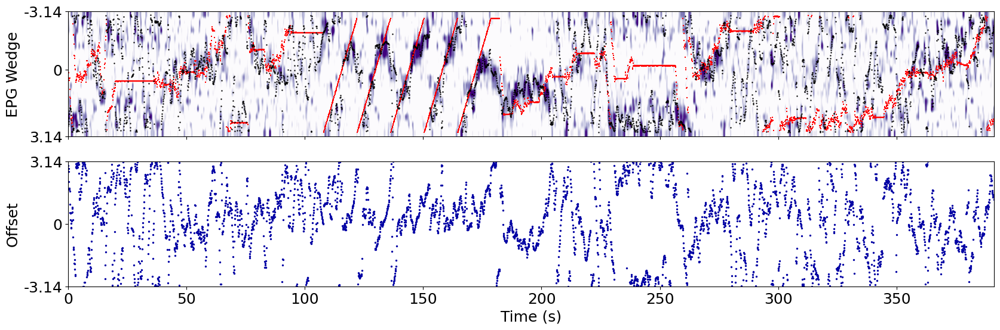

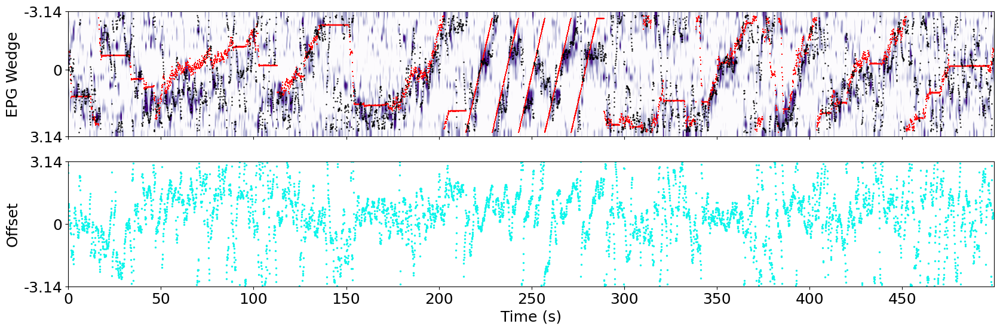

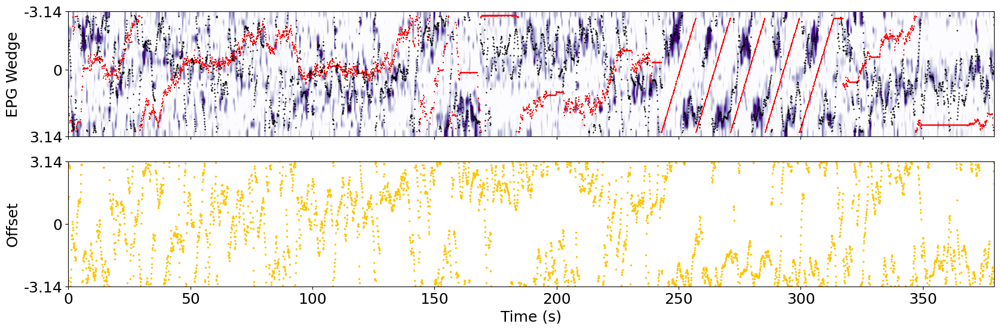

In [14]:
for session in sessions:
    session.single_session_plots(vmax=2.5)

In [95]:
offsets = np.zeros([len(sessions), 3])
rhos = np.zeros([len(sessions), 3])


for s, session in enumerate(sessions):
    for i, (start,stop) in enumerate(zip(session.starts, session.stops)):
        offset = session.offset[start:stop]
        _x, _y = pol2cart(np.ones(offset.shape),offset)
        rhos[s,i], offsets[s,i] = cart2pol(_x.mean(),_y.mean())


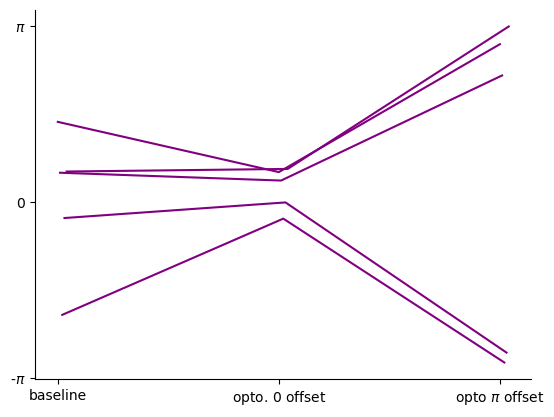

In [132]:
fig, ax = plt.subplots()
for s in range(len(sessions)):
    ax.plot(np.arange(3)+s*.01, offsets[s,:], color = 'purple')

for s in ('top', 'right'):
    ax.spines[s].set_visible(False)
ax.set_xticks([0,1,2],labels=['baseline', r'opto. $0$ offset', r'opto $\pi$ offset'])
ax.set_yticks([-3.14, 0, 3.14], labels=[r'-$\pi$', r'$0$', r'$\pi$'])

fig.savefig(figdir+"EL_remapping_summary.pdf",format='pdf')

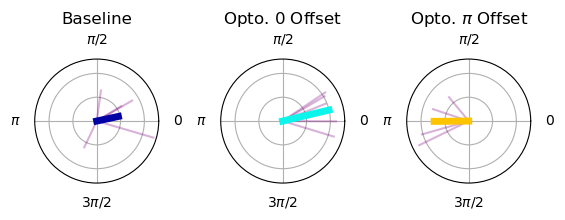

In [129]:
fig, ax = plt.subplots(1,3,subplot_kw={'projection': 'polar'},
                       sharex=True, sharey=True)#, hspace=.5)
fig.subplots_adjust(wspace = .5, hspace=.1)

cmap = plt.cm.get_cmap('jet')
for s in range(len(sessions)):
    for j in range(3):
        ax[j].plot([offsets[s,j], offsets[s,j]], [0, rho[s,j]], color='purple',alpha=.3) #cmap(float(j+.1)/3), alpha = .4)
    # ax.scatter([0,1,2], offsets[s,:], color = 'purple')
    
_x,_y = pol2cart(rhos, offsets)

_r, _p = cart2pol(_x.mean(axis=0), _y.mean(axis=0))

for j in range(3):
    ax[j].plot([_p[j], _p[j]], [0, _r[j]], color=cmap((float(j)+.1)/3),linewidth=5)

    ax[j].set_rticks([.2, .4], labels=['',''])
    ax[j].set_thetagrids([0, 90, 180, 270], labels=[r'$0$', r'$\pi/2$', r'$\pi$', r'$3\pi/2$'])
    
ax[0].set_title('Baseline')
ax[1].set_title(r'Opto. $0$ Offset')
ax[2].set_title(r'Opto. $\pi$ Offset')

figdir = "/media/mplitt/SSD_storage/fig_scratch/PDLC_2023"
os.makedirs(figdir,exist_ok=True)
fig.savefig(figdir+"EL_remapping_summary_polar.pdf",format='pdf')